<div style="color: PURPLE; background-color:WHITE; text-align: center;">
    <h1>CUSTOMER ANALYSIS</h1>
</div>

<div style="color: RED; background-color:WHITE; text-align: left;">
    <h1>1. Introduction</h1>
</div>

understanding your customers is not merely a competitive advantage; it's the heartbeat of successful marketing and business strategy. Customer segmentation, the art of classifying diverse customer bases into meaningful groups, holds the key to unlocking targeted marketing, enhanced customer experiences, and sustainable growth. This documentary report serves as a comprehensive guide to the fundamentals of customer segmentation, offering insights into the world of customer analysis, data sources, the strategic significance, and two pivotal segmentation approaches.

<div style="color: RED; background-color:WHITE; text-align: left;">
    <h1>2.Customer Analysis</h1>
</div>
Customer analysis refers to the process of gathering and evaluating data about a company's customers to gain a comprehensive understanding of their behavior, preferences, needs, and characteristics. This strategic practice allows businesses to segment their customer base, create detailed customer profiles, and extract valuable insights that drive decision-making, marketing strategies, product development, and customer engagement initiatives.

### About Dataset

## People

● ID: Customer's unique identifier

● Year_Birth: Customer's birth year

● Education: Customer's education level

● Marital_Status: Customer's marital status

● Income: Customer's yearly household income

● Kidhome: Number of children in customer's household

● Teenhome: Number of teenagers in customer's household

● Dt_Customer: Date of customer's enrollment with the company

● Recency: Number of days since customer's last purchase

● Complain: 1 if the customer complained in the last 2 years, 0 otherwise

### Products

● MntWines: Amount spent on wine in last 2 years


● MntFruits: Amount spent on fruits in last 2 years


● MntMeatProducts: Amount spent on meat in last 2 years


● MntFishProducts: Amount spent on fish in last 2 years


● MntSweetProducts: Amount spent on sweets in last 2 years


● MntGoldProds: Amount spent on gold in last 2 years

### Place

● NumWebPurchases: Number of purchases made through the company’s website

● NumCatalogPurchases: Number of purchases made using a catalogue

● NumStorePurchases: Number of purchases made directly in stores

● NumWebVisitsMonth: Number of visits to company’s website in the last month

<div style="color: RED; background-color:WHITE; text-align: left;">
    <h1>TARGET</h1>
</div>

The aim of this project is to build a predictive model that analyzes customer behavior to classify whether customers will accept the company's campaigns and to perform customer segmentation based on their spending patterns and campaign acceptance history.

<div style="color:BLUE;">

1. IMPORTING LIBRARIES

2. LOADING DATA

3. DATA CLEANING

4. EDA    

5. DATA PREPROCESSING

6. DIMENSIONALITY REDUCTION

7. CLUSTERING

8. CLASSIFICATION

9. CONCLUSION

<div style="color: PURPLE; background-color:white; text-align: left;">
    <h1>Importing Libraries</h1>
</div>

In [88]:
#Importing the Libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import datetime
from matplotlib import colors
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt, numpy as np
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import AgglomerativeClustering
from matplotlib.colors import ListedColormap
from sklearn import metrics
import warnings
import sys
if not sys.warnoptions:
    warnings.simplefilter("ignore")

<div style="color: RED; background-color:white; text-align: left;">
    <h1>Training Dataset</h1>
</div>

<div style="color: GREEN; background-color:white; text-align: left;">
    <h1>Loading Data</h1>
</div>

In [286]:
# Reading the dataset
df = pd.read_csv('customer_train.csv')
df.head()

,Unnamed: 0.1,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,0,0,5524,1957,S1,Lajang,58138000.0,0,0,04-09-2012,...,7,0,0,0,0,0,0,3,11,1
1,1,1,2174,1954,S1,Lajang,46344000.0,1,1,08-03-2014,...,5,0,0,0,0,0,0,3,11,0
2,2,2,4141,1965,S1,Bertunangan,71613000.0,0,0,21-08-2013,...,4,0,0,0,0,0,0,3,11,0
3,3,3,6182,1984,S1,Bertunangan,26646000.0,1,0,10-02-2014,...,6,0,0,0,0,0,0,3,11,0
4,4,4,5324,1981,S3,Menikah,58293000.0,1,0,19-01-2014,...,5,0,0,0,0,0,0,3,11,0


In [287]:
# Checking the shape of the dataset

df.shape

(1680, 31)

<div style="color: GREEN; background-color:white; text-align: left;">
    <h1>Data Cleaning</h1>
</div>

In this section

* Data Cleaning
* Feature Engineering

In order to, get a full grasp of what steps should I be taking to clean the dataset. Let us have a look at the information in data.

In [288]:
# Checking the columns of the dataset

df.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'ID', 'Year_Birth', 'Education',
       'Marital_Status', 'Income', 'Kidhome', 'Teenhome', 'Dt_Customer',
       'Recency', 'MntCoke', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
       'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact',
       'Z_Revenue', 'Response'],
      dtype='object')

In [289]:
# Finding the basic information regarding dataset

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1680 entries, 0 to 1679
Data columns (total 31 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0.1         1680 non-null   int64  
 1   Unnamed: 0           1680 non-null   int64  
 2   ID                   1680 non-null   int64  
 3   Year_Birth           1680 non-null   int64  
 4   Education            1680 non-null   object 
 5   Marital_Status       1680 non-null   object 
 6   Income               1663 non-null   float64
 7   Kidhome              1680 non-null   int64  
 8   Teenhome             1680 non-null   int64  
 9   Dt_Customer          1680 non-null   object 
 10  Recency              1680 non-null   int64  
 11  MntCoke              1680 non-null   int64  
 12  MntFruits            1680 non-null   int64  
 13  MntMeatProducts      1680 non-null   int64  
 14  MntFishProducts      1680 non-null   int64  
 15  MntSweetProducts     1680 non-null   i

* Here we have only 3 object type datatype and rest are numerical.

In [290]:
# Dropping columns because they will not contribute anything in model building
df.drop(["Unnamed: 0.1", "Unnamed: 0"],axis=1,inplace=True)

In [291]:
# Finding the number of unique values present in each column

df.nunique()

ID                     1680
Year_Birth               58
Education                 5
Marital_Status            6
Income                 1512
Kidhome                   3
Teenhome                  3
Dt_Customer             620
Recency                 100
MntCoke                 680
MntFruits               151
MntMeatProducts         485
MntFishProducts         171
MntSweetProducts        167
MntGoldProds            195
NumDealsPurchases        15
NumWebPurchases          13
NumCatalogPurchases      14
NumStorePurchases        14
NumWebVisitsMonth        15
AcceptedCmp3              2
AcceptedCmp4              2
AcceptedCmp5              2
AcceptedCmp1              2
AcceptedCmp2              2
Complain                  2
Z_CostContact             1
Z_Revenue                 1
Response                  2
dtype: int64

### NOTE

In above cell "Z_CostContact" and "Z_Revenue" have same value in all the rows that's why they are not going to contribute anything in the model building. So we can drop them.

In [292]:
df['Z_Revenue'].head(10)

0    11
1    11
2    11
3    11
4    11
5    11
6    11
7    11
8    11
9    11
Name: Z_Revenue, dtype: int64

In [293]:
#These 2 columns shows same data for all rows. it seems to be by mistake. So removing it
df=df.drop(df[['Z_Revenue','Z_CostContact']],axis=1)

In [294]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntCoke', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response'],
      dtype='object')

In [295]:
# Checking if any NaN is present in column or not

df.isna().any()

ID                     False
Year_Birth             False
Education              False
Marital_Status         False
Income                  True
Kidhome                False
Teenhome               False
Dt_Customer            False
Recency                False
MntCoke                False
MntFruits              False
MntMeatProducts        False
MntFishProducts        False
MntSweetProducts       False
MntGoldProds           False
NumDealsPurchases      False
NumWebPurchases        False
NumCatalogPurchases    False
NumStorePurchases      False
NumWebVisitsMonth      False
AcceptedCmp3           False
AcceptedCmp4           False
AcceptedCmp5           False
AcceptedCmp1           False
AcceptedCmp2           False
Complain               False
Response               False
dtype: bool

* Income column have some missing value in it so we will need to fill it by by either mean or median

<Axes: >

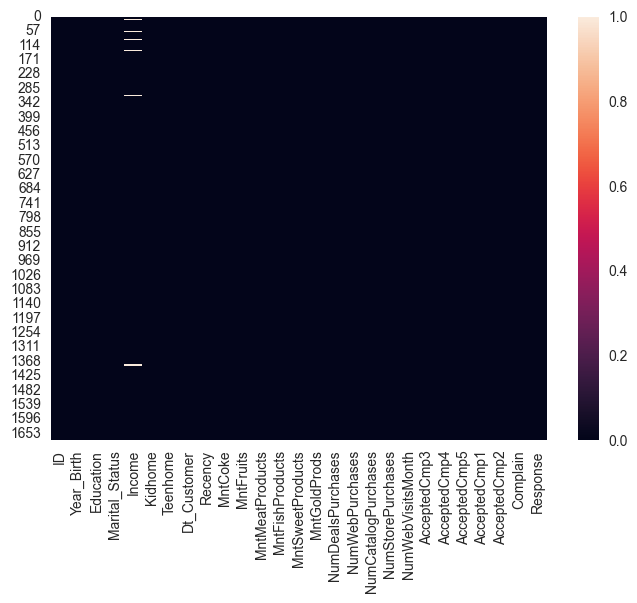

In [296]:
# Checking for null value using heatmap

sns.heatmap(df.isnull())

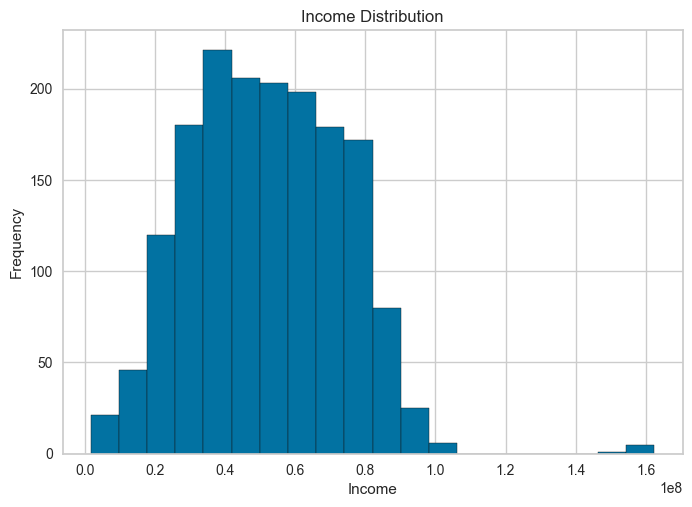

In [297]:
# Plot a histogram of income
plt.hist(df['Income'], bins=20, edgecolor='k')
plt.xlabel('Income')
plt.ylabel('Frequency') 
plt.title('Income Distribution')
plt.show()

In [298]:
#Since there are outliers, we are using the median

df['Income'] = df['Income'].fillna(df['Income'].median())
df.isna().any()

ID                     False
Year_Birth             False
Education              False
Marital_Status         False
Income                 False
Kidhome                False
Teenhome               False
Dt_Customer            False
Recency                False
MntCoke                False
MntFruits              False
MntMeatProducts        False
MntFishProducts        False
MntSweetProducts       False
MntGoldProds           False
NumDealsPurchases      False
NumWebPurchases        False
NumCatalogPurchases    False
NumStorePurchases      False
NumWebVisitsMonth      False
AcceptedCmp3           False
AcceptedCmp4           False
AcceptedCmp5           False
AcceptedCmp1           False
AcceptedCmp2           False
Complain               False
Response               False
dtype: bool

* First of all, for the missing values, First check the outlier in the income column.

In [299]:
income_column = df['Income']

# Calculate the IQR (Interquartile Range)
Q1 = income_column.quantile(0.25)
Q3 = income_column.quantile(0.75)
IQR = Q3 - Q1

# Define a lower bound and upper bound for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Find outliers
outliers = df[(income_column < lower_bound) | (income_column > upper_bound)]

# Display only the 'Income' column of the outliers
outlier_incomes = outliers['Income']

# Display the outlier incomes
print("Outliers in the Income column:")
print(outlier_incomes)

Outliers in the Income column:
164     157243000.0
617     162397000.0
655     153924000.0
687     160803000.0
1300    157733000.0
1653    157146000.0
Name: Income, dtype: float64


Removing the outliers from income column.

In [300]:
# Remove outliers by filtering the DataFrame
df_no_outliers = df[(income_column >= lower_bound) & (income_column <= upper_bound)]
df=df_no_outliers.copy()
# Display the DataFrame without outliers
print("DataFrame without outliers:")
print(df['Income'])

DataFrame without outliers:
0       58138000.0
1       46344000.0
2       71613000.0
3       26646000.0
4       58293000.0
           ...    
1675    20193000.0
1676    27573000.0
1677    15862000.0
1678    49544000.0
1679    33228000.0
Name: Income, Length: 1674, dtype: float64


In [301]:
df.Marital_Status.unique()


array(['Lajang', 'Bertunangan', 'Menikah', 'Cerai', 'Janda', 'Duda'],
      dtype=object)

In [302]:
# use the replace method to convert Indonesian to English
df['Marital_Status'].replace({'Lajang': 'Single', 
                              'Bertunangan': 'Engaged', 
                              'Menikah': 'Married', 
                              'Cerai': ' Divorced', 
                              'Janda': 'Widow', 
                              'Duda': 'Widower'}, inplace=True)
# Define a mapping dictionary for Education
education_mapping = {
    'S1':'Bsc',
    'S2':'Msc',
    'S3':'Phd',
    'D3':'Diploma',
    'SMA':'High SChool'
    
}

# Replace the Education values using the mapping dictionary
df['Education'].replace(education_mapping, inplace=True)

* Now we will deal with Dt_Custumer feature

In [303]:
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format='%d-%m-%Y')
df['Dt_Customer'].head()

0   2012-09-04
1   2014-03-08
2   2013-08-21
3   2014-02-10
4   2014-01-19
Name: Dt_Customer, dtype: datetime64[ns]

<div style="color: GREEN; background-color:white; text-align: left;">
    <h1>Feature Engineering</h1>
</div>


Feature engineering involves preparing and shaping data for machine learning models. It includes selecting relevant features, transforming data, creating new informative variables, and handling missing values. Effective feature engineering enhances model performance by providing meaningful input features for accurate predictions. It's a crucial step in the data science pipeline, optimizing model outcomes through data manipulation and domain knowledge application.

In the next bit, I will be performing the following steps to engineer some new features

1)Creating Age column from Year_Birth column.

2)Creating Total_Kids column from Kidhome and Teenhome columns.

3)Creating Total_Mnt column from MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts and MntGoldProds columns.

4)Creating Total_Purchases column from NumWebPurchases,NumCatalogPurchases and NumStorePurchases columns.


In [304]:
# 1)Creating Age column from Year_Birth column.
df["Age"] = 2023 - df["Year_Birth"]

In [305]:
# 2)Creating Total_Kids column from Kidhome and Teenhome columns.
df["Total_kids"] = df["Kidhome"] + df["Teenhome"]

In [306]:
# 3)Creating Total_Mnt column from MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts and MntGoldProds columns.
df["Total_Mnt"] = df["MntCoke"] + df["MntFruits"] + df["MntMeatProducts"] + df["MntFishProducts"] + df["MntSweetProducts"] + df["MntGoldProds"]

In [307]:
# 4)Creating Total_Purchases column from NumWebPurchases,NumCatalogPurchases and NumStorePurchases columns.
df["Total_Purchases"] = df["NumWebPurchases"] + df["NumCatalogPurchases"] + df["NumStorePurchases"]

In [308]:
df.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,MntFruits,MntMeatProducts,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Total_kids,Total_Mnt,Total_Purchases
count,1674.000000,1674.000000,1.674000e+03,1674.000000,1674.000000,1674,1674.000000,1.674000e+03,1674.000000,1.674000e+03,...,1674.000000,1674.000000,1674.000000,1674.000000,1674.000000,1674.000000,1674.000000,1674.000000,1.674000e+03,1674.000000
mean,5555.318399,1968.823178,5.162596e+07,0.452808,0.500597,2013-07-11 05:22:34.838709760,49.091398,3.058722e+05,25998.805257,1.634080e+05,...,0.074671,0.069295,0.062724,0.011947,0.010155,0.144564,54.176822,0.953405,6.029450e+05,12.497013
min,0.000000,1893.000000,1.730000e+06,0.000000,0.000000,2012-07-30 00:00:00,0.000000,0.000000e+00,0.000000,1.000000e+03,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,27.000000,0.000000,5.000000e+03,0.000000
25%,2828.500000,1960.000000,3.577125e+07,0.000000,0.000000,2013-01-17 00:00:00,24.000000,2.400000e+04,1000.000000,1.600000e+04,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,46.000000,0.000000,6.900000e+04,6.000000
50%,5387.500000,1970.000000,5.125000e+07,0.000000,0.000000,2013-07-11 12:00:00,50.000000,1.750000e+05,8000.000000,6.800000e+04,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,53.000000,1.000000,3.915000e+05,12.000000
75%,8372.250000,1977.000000,6.754350e+07,1.000000,1.000000,2013-12-29 00:00:00,74.000000,4.957500e+05,32000.000000,2.317500e+05,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,63.000000,1.000000,1.033750e+06,18.000000
max,11191.000000,1996.000000,1.054710e+08,2.000000,2.000000,2014-06-29 00:00:00,99.000000,1.492000e+06,199000.000000,1.725000e+06,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,130.000000,3.000000,2.525000e+06,32.000000
std,3240.103860,12.040022,2.044131e+07,0.547107,0.550226,NaN,28.920786,3.389162e+05,39578.608198,2.156281e+05,...,0.262939,0.254031,0.242538,0.108682,0.100291,0.351766,12.040022,0.763155,6.005849e+05,7.142746


## Exploring Dataset

<div style="color: RED; background-color:white; text-align: left;">
    <h1> EDA based on Education status</h1>
</div>

In [309]:
customer_count=df.groupby("Education").count()['ID']
customer_count

Education
Bsc            832
Diploma        159
High SChool     35
Msc            278
Phd            370
Name: ID, dtype: int64

In [310]:
label=df.groupby('Education').count()['ID'].index
label

Index(['Bsc', 'Diploma', 'High SChool', 'Msc', 'Phd'], dtype='object', name='Education')

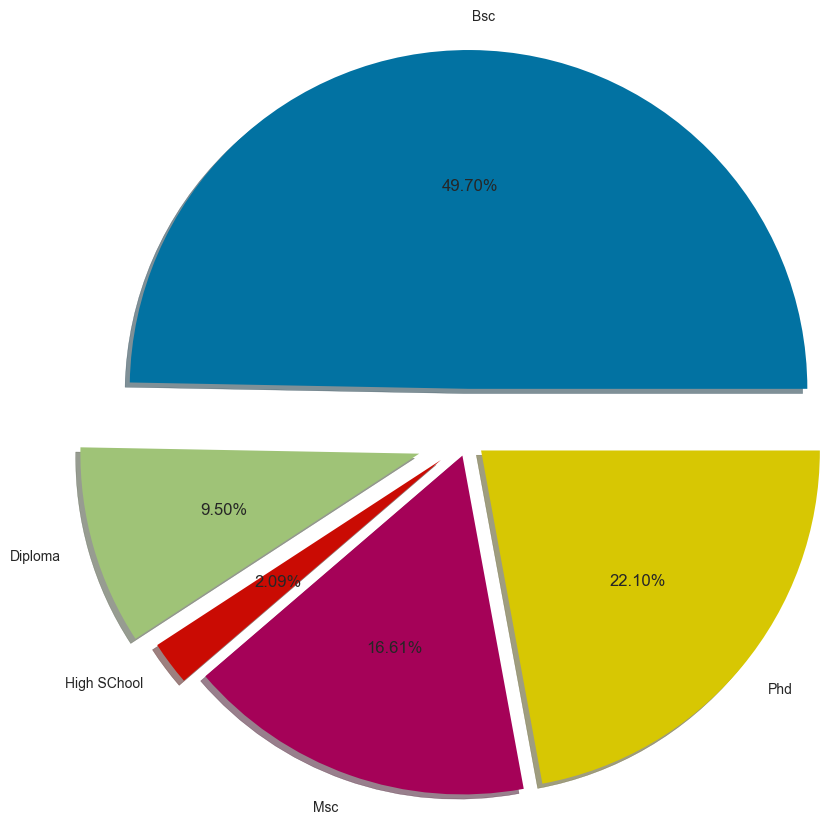

In [311]:
plt.axis("equal")
plt.pie(customer_count,labels=label, shadow=True, autopct='%1.2f%%',radius=2,explode=[0.3,0.3,0.2,0.1,0.1])
plt.show()

Observation:

Here We found that more than 49.70% Customers with Bsc and only 2.09% below High scool

In [312]:
#Average Spending on coke
Coke_spent=df.groupby("Education")['MntCoke'].mean()
Coke_spent

Education
Bsc            287319.711538
Diploma        189503.144654
High SChool      3285.714286
Msc            336913.669065
Phd            402897.297297
Name: MntCoke, dtype: float64

In [313]:
#Average Spending on Fruit
Fruit_spent=df.groupby("Education")['MntFruits'].mean()
Fruit_spent

Education
Bsc            30707.932692
Diploma        27433.962264
High SChool    10085.714286
Msc            21273.381295
Phd            19848.648649
Name: MntFruits, dtype: float64

In [314]:
#Average Spending on Meat
Meat_spent=df.groupby("Education")['MntMeatProducts'].mean()
Meat_spent

Education
Bsc            181719.951923
Diploma        124704.402516
High SChool      9571.428571
Msc            155496.402878
Phd            159359.459459
Name: MntMeatProducts, dtype: float64

In [315]:
#Average Spending on Fish
Fish_spent=df.groupby("Education")['MntFishProducts'].mean()
Fish_spent

Education
Bsc            43192.307692
Diploma        43716.981132
High SChool    13742.857143
Msc            31064.748201
Phd            27175.675676
Name: MntFishProducts, dtype: float64

In [316]:
#Average Spending on Sweet
Sweet_spent=df.groupby("Education")['MntSweetProducts'].mean()
Sweet_spent 

Education
Bsc            32483.173077
Diploma        32100.628931
High SChool    10485.714286
Msc            20187.050360
Phd            19651.351351
Name: MntSweetProducts, dtype: float64

In [317]:
#Average Spending on Gold
Gold_spent=df.groupby("Education")['MntGoldProds'].mean()
Gold_spent

Education
Bsc            51082.932692
Diploma        44081.761006
High SChool    23257.142857
Msc            39730.215827
Phd            30878.378378
Name: MntGoldProds, dtype: float64

In [318]:
xpos = np.arange(len(label))
xpos

array([0, 1, 2, 3, 4])

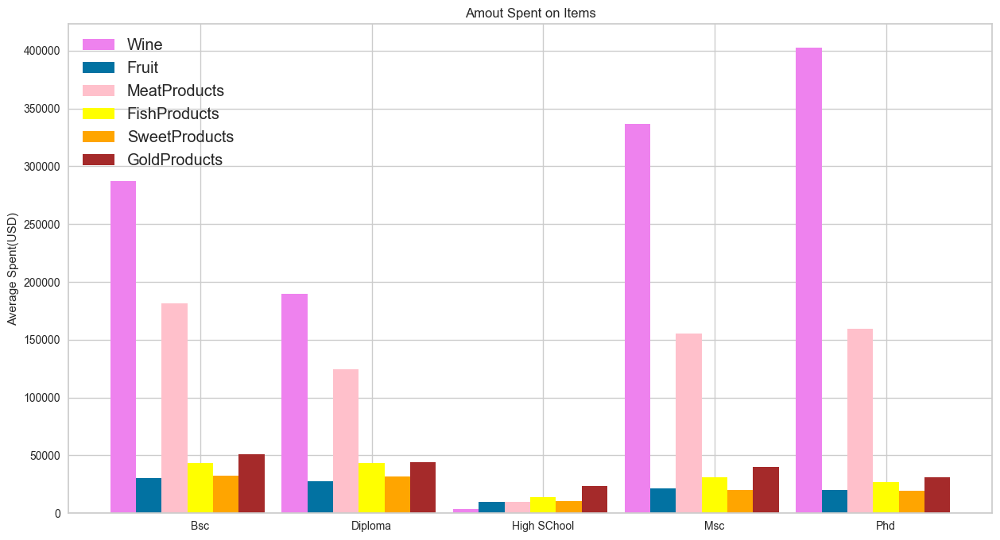

In [319]:
plt.figure(figsize=(15,8))
plt.bar(xpos-0.45,Coke_spent,width=0.15, label="Wine",color='violet')
plt.bar(xpos-0.3,Fruit_spent,width=0.15,label="Fruit")
plt.bar(xpos-0.15,Meat_spent,width=0.15,label="MeatProducts",color='pink')
plt.bar(xpos,Fish_spent,width=0.15,label="FishProducts",color='yellow')
plt.bar(xpos+0.15,Sweet_spent,width=0.15,label="SweetProducts",color='orange')
plt.bar(xpos+0.3,Gold_spent,width=0.15,label="GoldProducts",color='brown')

plt.xticks(xpos,label)
plt.ylabel("Average Spent(USD)")
plt.title('Amout Spent on Items')
plt.legend(loc='upper left',shadow=True,fontsize='large')

Observation:

Here we found that More Educated people spending more on coke!! In case of Fruits We can't find big variation. In case of Meat Products also not that much variation based on education. Compared to others People with only Basic Education spent very less on all items. It may be due to their less income. Top spending item is coke then Meat Products.

<div style="color: RED; background-color:white; text-align: left;">
    <h1> EDA Based on Marital Status</h1>
</div>

In [320]:
customer_count2=df.groupby("Marital_Status").count()['ID']
customer_count2

Marital_Status
 Divorced    176
Engaged      435
Married      648
Single       360
Widow         52
Widower        3
Name: ID, dtype: int64

In [321]:
label2=df.groupby('Marital_Status').count()['ID'].index
label2

Index([' Divorced', 'Engaged', 'Married', 'Single', 'Widow', 'Widower'], dtype='object', name='Marital_Status')

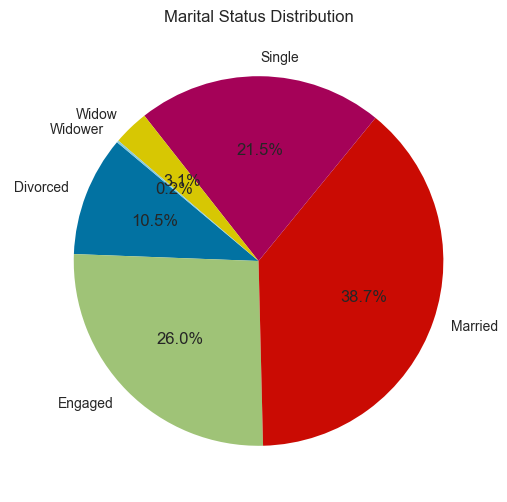

In [322]:

# Create a pie chart
plt.figure(figsize=(6, 6)) 
plt.pie(customer_count2,labels=label2, autopct='%1.1f%%', startangle=140)

# Add a title
plt.title('Marital Status Distribution')

# Display the plot
plt.show()

Observation:

Here We found that more than 38.7% Customers with Married and only 0.2% below widower

In [323]:
#Average Spending on coke
Coke_spent2=df.groupby("Marital_Status")['MntCoke'].mean()
Coke_spent2

Marital_Status
 Divorced    324579.545455
Engaged      315204.597701
Married      301283.950617
Single       290969.444444
Widow        331826.923077
Widower      184666.666667
Name: MntCoke, dtype: float64

In [324]:
#Average Spending on Fruit
Fruit_spent2=df.groupby("Marital_Status")['MntFruits'].mean()
Fruit_spent2

Marital_Status
 Divorced    27886.363636
Engaged      24834.482759
Married      24777.777778
Single       28208.333333
Widow        30538.461538
Widower       4000.000000
Name: MntFruits, dtype: float64

In [325]:
#Average Spending on Meat
Meat_spent2=df.groupby("Marital_Status")['MntMeatProducts'].mean()
Meat_spent2

Marital_Status
 Divorced    146676.136364
Engaged      163685.057471
Married      156165.123457
Single       186161.111111
Widow        158365.384615
Widower       26333.333333
Name: MntMeatProducts, dtype: float64

In [326]:
#Average Spending on Fish
Fish_spent2=df.groupby("Marital_Status")['MntFishProducts'].mean()
Fish_spent2

Marital_Status
 Divorced    34823.863636
Engaged      38648.275862
Married      33929.012346
Single       40741.666667
Widow        46961.538462
Widower       7666.666667
Name: MntFishProducts, dtype: float64

In [327]:
#Average Spending on Sweet
Sweet_spent2=df.groupby("Marital_Status")['MntSweetProducts'].mean()
Sweet_spent2

Marital_Status
 Divorced    28448.863636
Engaged      26381.609195
Married      26189.814815
Single       28005.555556
Widow        35057.692308
Widower       7000.000000
Name: MntSweetProducts, dtype: float64

In [328]:
#Average Spending on Gold
Gold_spent2=df.groupby("Marital_Status")['MntGoldProds'].mean()
Gold_spent2

Marital_Status
 Divorced    48181.818182
Engaged      43737.931034
Married      40333.333333
Single       45775.000000
Widow        49846.153846
Widower      27000.000000
Name: MntGoldProds, dtype: float64

In [329]:
xpos2 = np.arange(len(label2))
xpos2

array([0, 1, 2, 3, 4, 5])

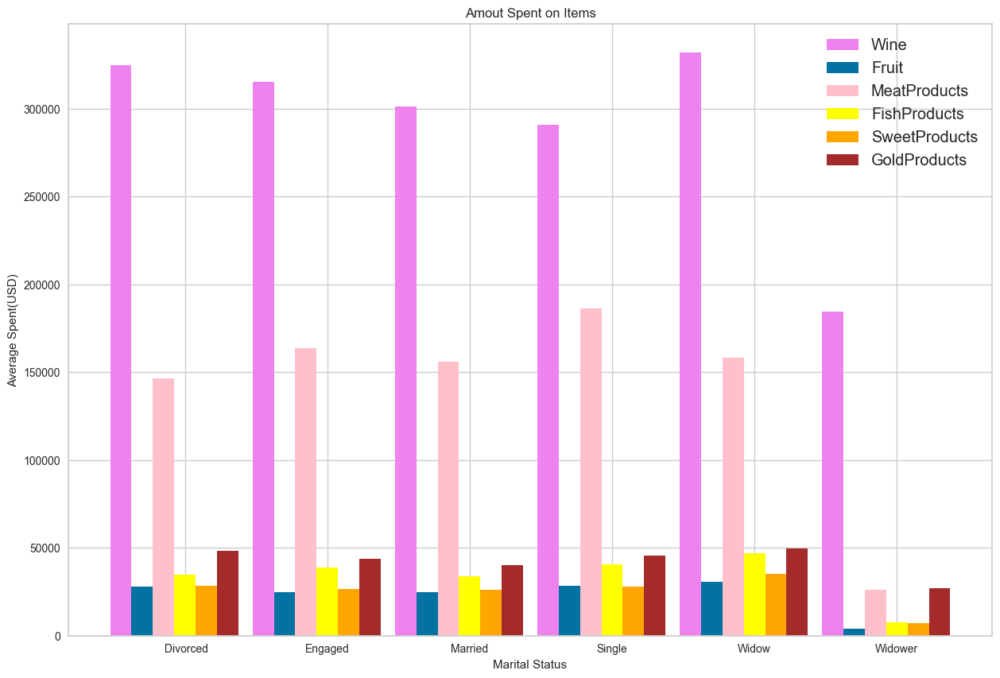

In [330]:
plt.figure(figsize=(15,10))
plt.bar(xpos2-0.45,Coke_spent2,width=0.15, label="Wine",color='violet')
plt.bar(xpos2-0.3,Fruit_spent2,width=0.15,label="Fruit")
plt.bar(xpos2-0.15,Meat_spent2,width=0.15,label="MeatProducts",color='pink')
plt.bar(xpos2,Fish_spent2,width=0.15,label="FishProducts",color='yellow')
plt.bar(xpos2+0.15,Sweet_spent2,width=0.15,label="SweetProducts",color='orange')
plt.bar(xpos2+0.3,Gold_spent2,width=0.15,label="GoldProducts",color='brown')

plt.xticks(xpos2,label2)
plt.xlabel('Marital Status')
plt.ylabel("Average Spent(USD)")
plt.title('Amout Spent on Items')
plt.legend(loc='best',shadow=True,fontsize='large')

Observation:

In case of Absurd we can see Average spending very high compared to others. That may be due to very less sample data. There are only 2 customers in this class. So if one of them very lavish then it will effect result. So we cannot consder it as a common case



## Age

In [331]:
customer_count3=df.groupby("Age").count()['ID']
customer_count3

Age
27      2
28      3
29      3
30      4
31      9
32     12
33     11
34     27
35     26
36     22
37     33
38     24
39     21
40     29
41     32
42     28
43     28
44     38
45     61
46     37
47     65
48     60
49     49
50     57
51     65
52     59
53     62
54     53
55     35
56     35
57     37
58     60
59     30
60     34
61     34
62     30
63     42
64     38
65     45
66     28
67     40
68     33
69     36
70     31
71     41
72     26
73     20
74     18
75     18
76      8
77     13
78      6
79      7
80      5
82      1
123     1
124     1
130     1
Name: ID, dtype: int64

In [332]:
#Dropping the outliers by setting a cap on Age. 
df = df[(df["Age"]<90)]
print("The total number of data-points after removing the outliers are:", len(df))

The total number of data-points after removing the outliers are: 1671


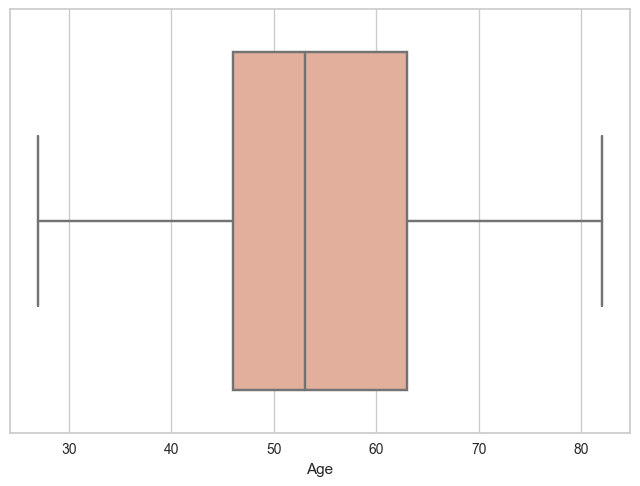

In [333]:
sns.boxplot(x = df['Age'], color= '#eea990')
plt.show()

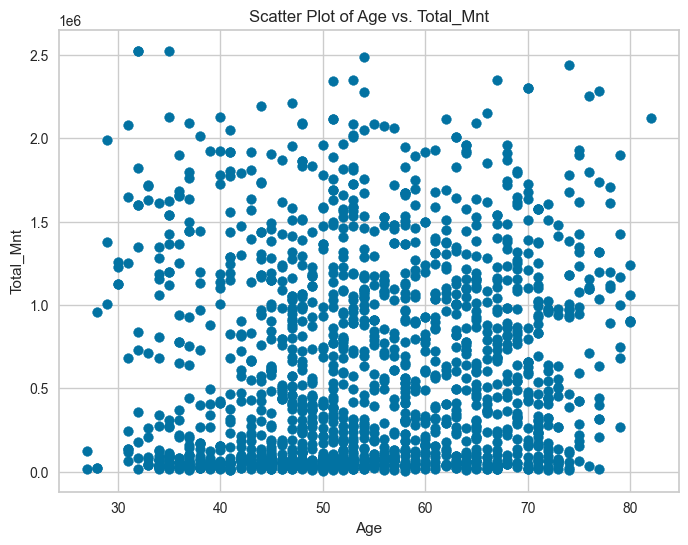

In [334]:
# Create a scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(df['Age'], df['Total_Mnt'])
plt.xlabel('Age')
plt.ylabel('Total_Mnt')
plt.title('Scatter Plot of Age vs. Total_Mnt')
plt.grid(True)  # Add grid lines (optional)

plt.show()

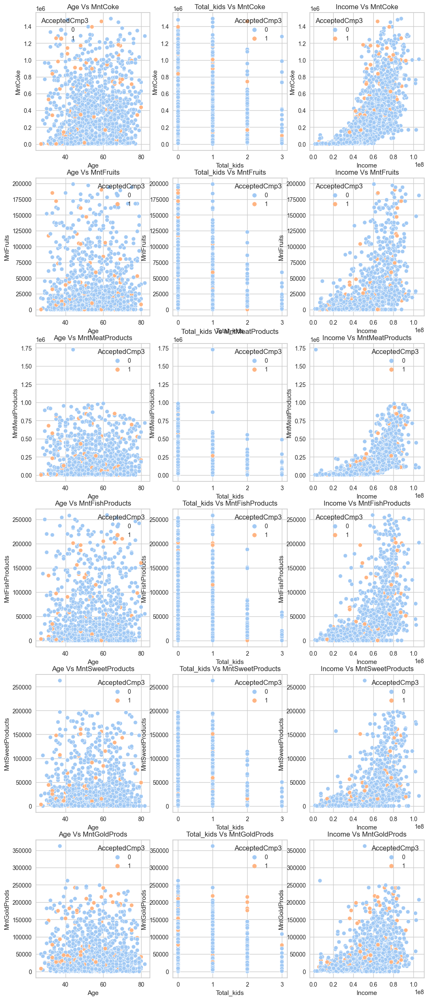

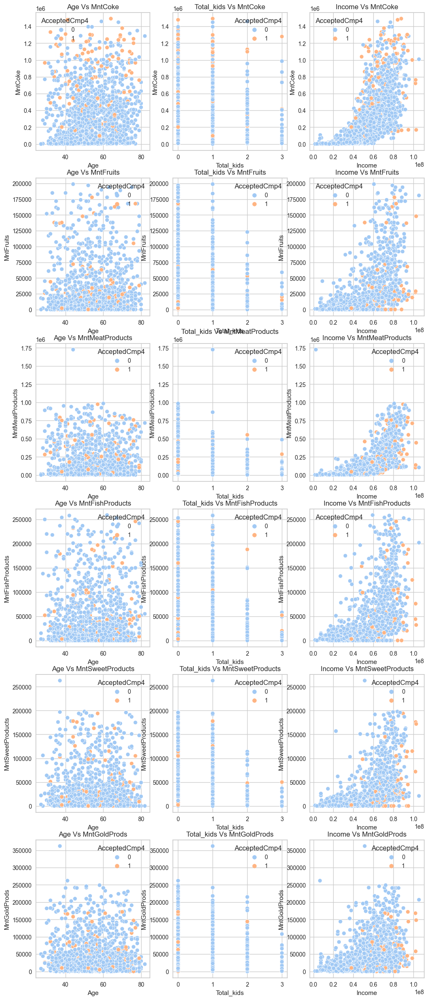

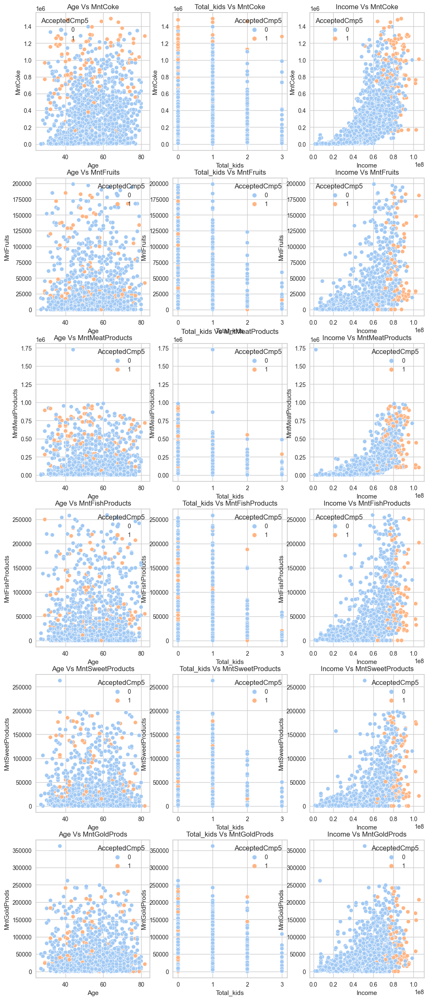

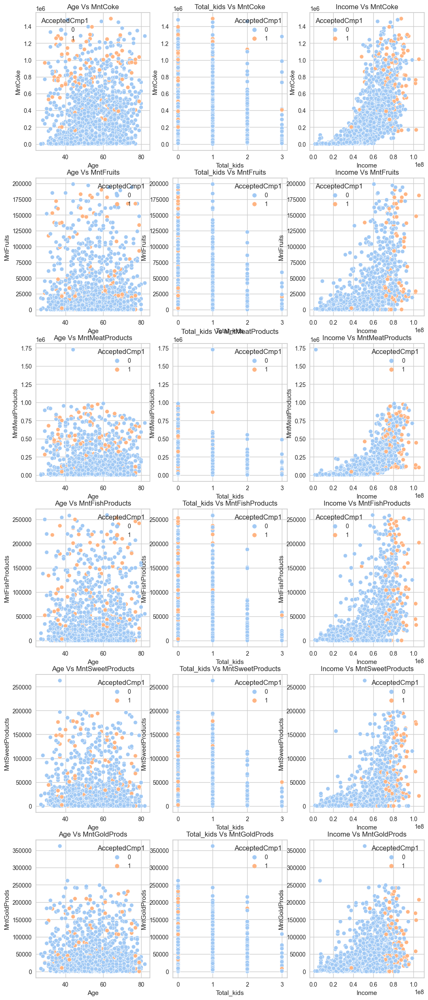

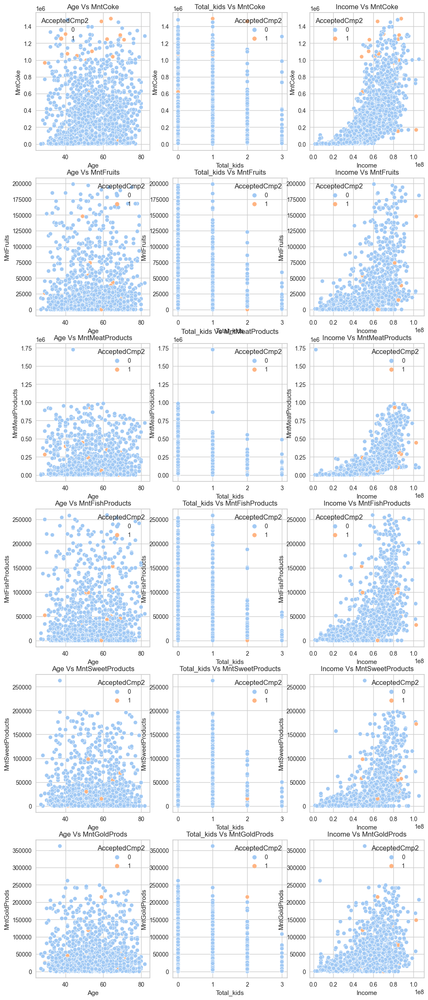

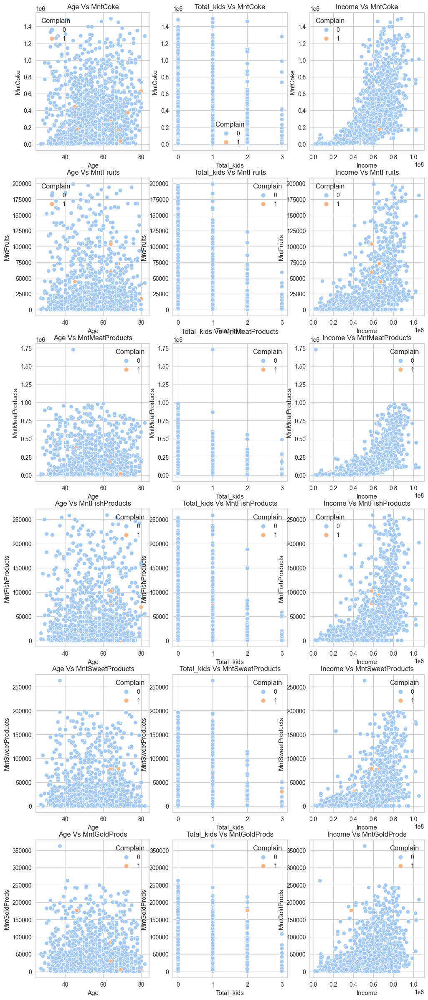

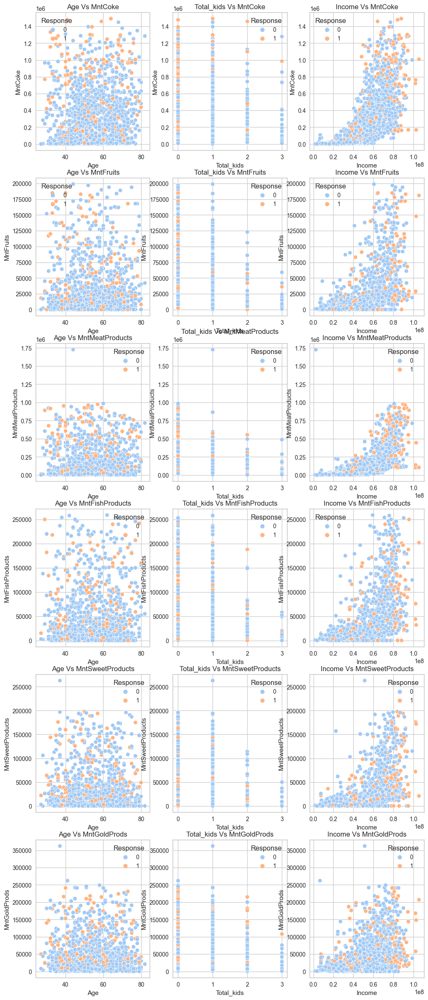

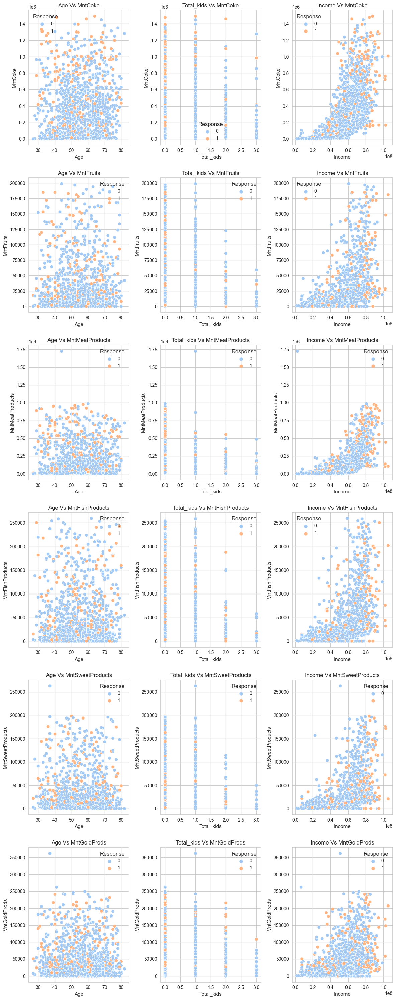

In [335]:

cust_features = ['Age', 'Total_kids', 'Income']
prods = ['MntCoke','MntFruits','MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds']
cmps = ['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response','Response']

for cmp in cmps:
    # Create a 6x6 grid of subplots
    fig, axes = plt.subplots(6, 3, figsize=(12, 30))
    for feature in cust_features:
        for prod in prods:
            sns.scatterplot(x=feature, 
                            y=prod, 
                            hue=cmp, 
                            data=df, 
                            palette='pastel', 
                            ax=axes[prods.index(prod), cust_features.index(feature)])
            axes[prods.index(prod), cust_features.index(feature)].set_title(f'{feature} Vs {prod}')


# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

Overall, these scatterplots serve as a visual exploration of the relationships between customer characteristics, product preferences, and campaign acceptance, helping you identify potential patterns and insights in your data.

<div style="color: GREEN; background-color:white; text-align: left;">
    <h1>Data Preprocessing</h1>
</div>

The following steps are applied to preprocess the data:

* Label encoding the categorical features
* Scaling the features using the standard scaler

In [336]:
# encoding
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()

col = ['Education','Marital_Status']
for i in col:
    df.loc[:, i] = label_encoder.fit_transform(df[i])
    
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Total_kids,Total_Mnt,Total_Purchases
0,5524,1957,0,3,58138000.0,0,0,2012-09-04,58,635000,...,0,0,0,0,0,1,66,0,1617000,22
1,2174,1954,0,3,46344000.0,1,1,2014-03-08,38,11000,...,0,0,0,0,0,0,69,2,27000,4
2,4141,1965,0,1,71613000.0,0,0,2013-08-21,26,426000,...,0,0,0,0,0,0,58,0,776000,20
3,6182,1984,0,1,26646000.0,1,0,2014-02-10,26,11000,...,0,0,0,0,0,0,39,1,53000,6
4,5324,1981,4,2,58293000.0,1,0,2014-01-19,94,173000,...,0,0,0,0,0,0,42,1,422000,14


##  Correlation among all features

Let's look how correlated are all these features related to each other

In [337]:
df.corr()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Total_kids,Total_Mnt,Total_Purchases
ID,1.000000,0.024022,-0.012766,0.000227,0.030590,-0.012762,-0.007914,-0.010284,-0.049368,0.003203,...,-0.010156,0.014654,-0.012548,0.001480,0.047659,-0.011021,-0.024022,-0.014851,0.013951,0.003306
Year_Birth,0.024022,1.000000,-0.143308,0.074912,-0.220306,0.242525,-0.354402,0.004698,-0.034773,-0.174461,...,-0.077449,0.004172,-0.021345,-0.024087,-0.010660,0.022568,-1.000000,-0.081625,-0.126189,-0.187765
Education,-0.012766,-0.143308,1.000000,-0.002215,0.047006,-0.018181,0.105482,0.044220,-0.018101,0.133096,...,0.047019,-0.020255,-0.035339,0.018200,-0.044333,0.056471,0.143308,0.063000,0.012972,0.023932
Marital_Status,0.000227,0.074912,-0.002215,1.000000,-0.015086,0.010225,-0.062811,0.005863,-0.014488,-0.025110,...,-0.001503,-0.024897,0.018762,-0.067525,0.012218,0.053050,-0.074912,-0.037945,0.002017,-0.022723
Income,0.030590,-0.220306,0.047006,-0.015086,1.000000,-0.526897,0.045049,0.026983,-0.016841,0.732024,...,0.233729,0.408591,0.346290,0.098647,-0.035039,0.156301,0.220306,-0.345171,0.824107,0.776912
Kidhome,-0.012762,0.242525,-0.018181,0.010225,-0.526897,1.000000,-0.032173,0.050591,0.004529,-0.494973,...,-0.152309,-0.194884,-0.169354,-0.071026,0.030911,-0.070350,-0.242525,0.693539,-0.554934,-0.569630
Teenhome,-0.007914,-0.354402,0.105482,-0.062811,0.045049,-0.032173,1.000000,-0.034335,0.024910,0.012468,...,0.026413,-0.178770,-0.146107,-0.010183,0.011010,-0.149039,0.354402,0.697733,-0.134959,0.031418
Dt_Customer,-0.010284,0.004698,0.044220,0.005863,0.026983,0.050591,-0.034335,1.000000,-0.036821,-0.166721,...,-0.036502,-0.007272,0.030210,0.010669,-0.034703,-0.178308,-0.004698,0.011512,-0.150276,-0.163513
Recency,-0.049368,-0.034773,-0.018101,-0.014488,-0.016841,0.004529,0.024910,-0.036821,1.000000,-0.002480,...,0.017502,-0.023046,-0.040009,-0.023742,0.002688,-0.179241,0.034773,0.021201,0.003642,0.000296
MntCoke,0.003203,-0.174461,0.133096,-0.025110,0.732024,-0.494973,0.012468,-0.166721,-0.002480,1.000000,...,0.382655,0.466746,0.362027,0.192485,-0.043920,0.228540,0.174461,-0.345775,0.897416,0.760723


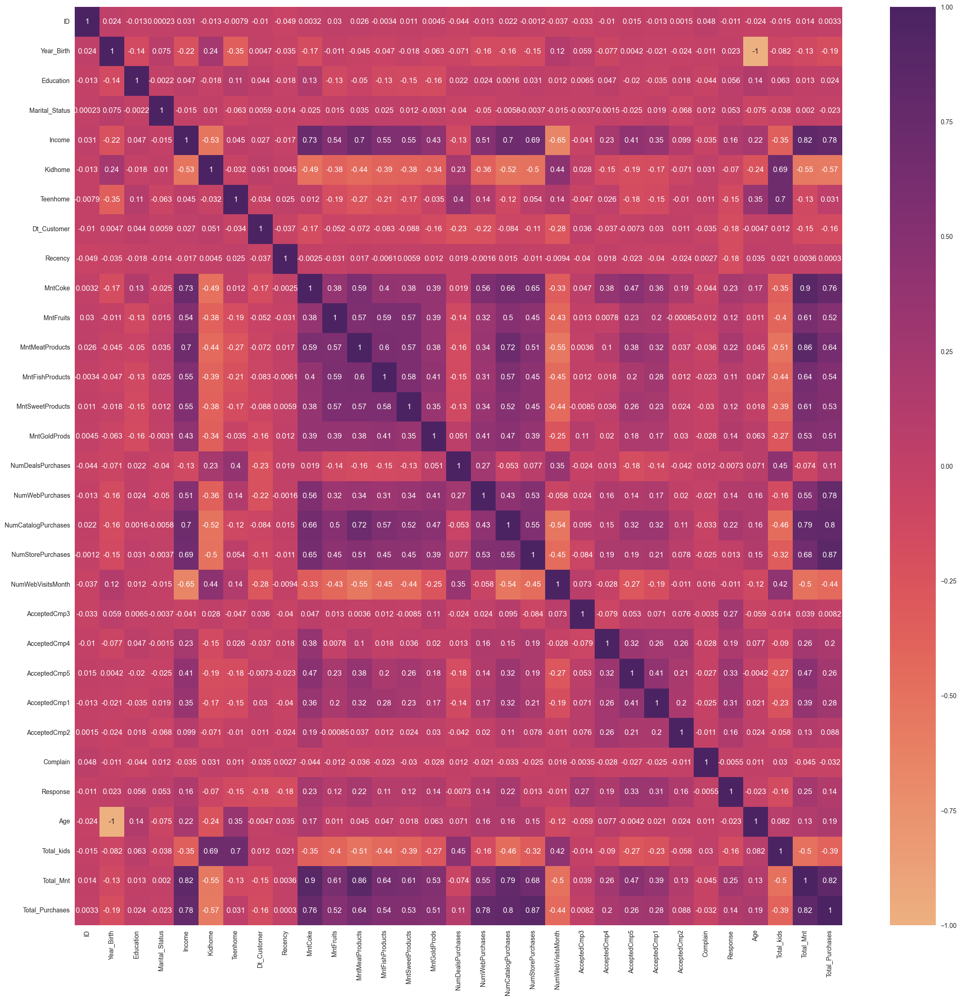

In [338]:
cor = df.corr()
plt.figure(figsize = (27,26))

sns.heatmap(cor, 
            annot = True,
            cmap = 'flare')
plt.show()

* It is used to calculate how one variable is correlated/ dependent on other variable.
* Extreme values signify high correlation.
* Multicollinear variables with correlation more than a threshold are usually dropped from the dataset.

In [339]:
df.drop(["Dt_Customer"],axis=1,inplace=True)

In [340]:
# creating a subset of dataframe by dropping the features on deals accepted and promotions
cols_del = ['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1','AcceptedCmp2', 'Complain']
df=df.drop(cols_del, axis=1)

### scailing


In [341]:
#Scaling
scaler = StandardScaler()
scaler.fit(df)
scaled_df1 = pd.DataFrame(scaler.transform(df),columns= df.columns)
print("All features are now scaled")

All features are now scaled


<div style="color: green; background-color:white; text-align: left;">
    <h1>Dimensionality Reduction</h1>
</div>

Principal component analysis (PCA):

it is a technique for reducing the dimensionality of such datasets, increasing interpretability but at the same time minimizing information loss.

Now we will do Dimensionality Reduction through the method of PCA and will reduce dimensions to 3.

After reduction we will plot it.

In [342]:
#Initiating PCA to reduce dimentions aka features to 3
pca = PCA(n_components=3)
pca.fit(scaled_df1)
PCA_df = pd.DataFrame(pca.transform(scaled_df1), columns=(["col1","col2", "col3"]))
PCA_df.describe().T

,count,mean,std,min,25%,50%,75%,max
col1,1671.0,-1.700880e-17,2.916215,-5.098639,-2.714159,-0.636075,2.592306,7.650301
col2,1671.0,5.953081e-17,1.673892,-3.676854,-1.345223,-0.008949,1.278681,5.335708
col3,1671.0,3.401761e-17,1.325675,-3.699707,-0.872533,-0.013137,0.819759,4.940353


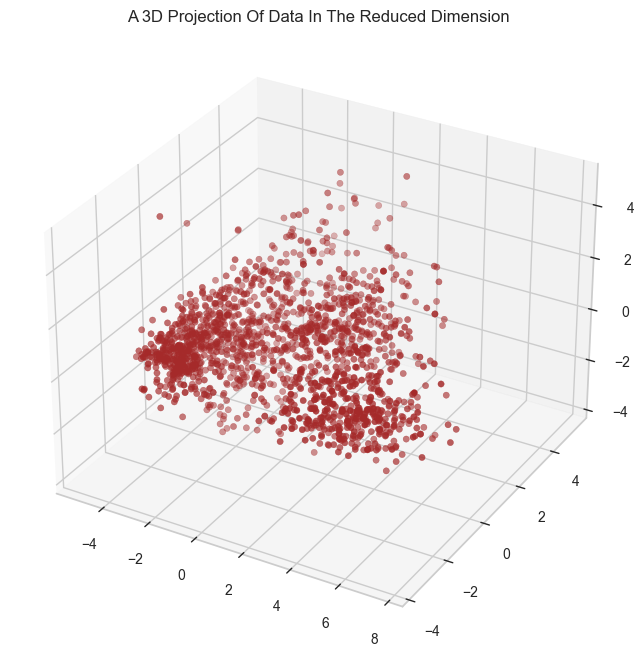

In [343]:
#A 3D Projection Of Data In The Reduced Dimension
x =PCA_df["col1"]
y =PCA_df["col2"]
z =PCA_df["col3"]
#To plot
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, c="brown", marker="o" )
ax.set_title("A 3D Projection Of Data In The Reduced Dimension")
plt.show()

<div style="color: green; background-color:white; text-align: left;">
    <h1>Clustering</h1>
</div>

I will do Agglomerative Clustering. The steps are:-

1)Finding right number of cluster through elbow method.

2)Fitting Agglomerative Clustering model.

3)Examining the clusters.


### Elbow Method

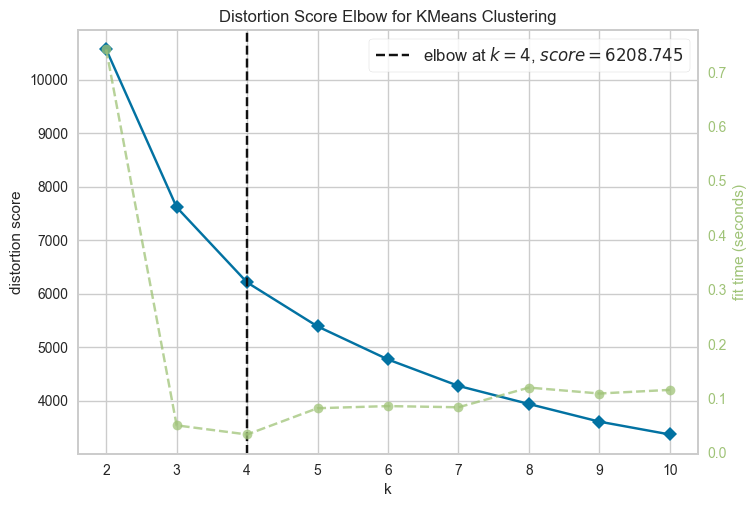

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [344]:
# Quick examination of elbow method to find numbers of clusters to make.
Elbow_M = KElbowVisualizer(KMeans(), k=10)
Elbow_M.fit(PCA_df)
Elbow_M.show()

As it is not very clear from the elbow method that which value of K to choose.

In [345]:
#Initiating the Agglomerative Clustering model 
AC = AgglomerativeClustering(n_clusters=4)
# fit model and predict clusters
yhat_AC = AC.fit_predict(PCA_df)
PCA_df["Clusters"] = yhat_AC
df["Clusters"]=yhat_AC

Since this is an unsupervised clustering. We do not have a tagged feature to evaluate or score our model. The purpose of this section is to study the patterns in the clusters formed and determine the nature of the clusters' patterns.

To examine the clusters formed let's have a look at the 3-D distribution of the clusters.

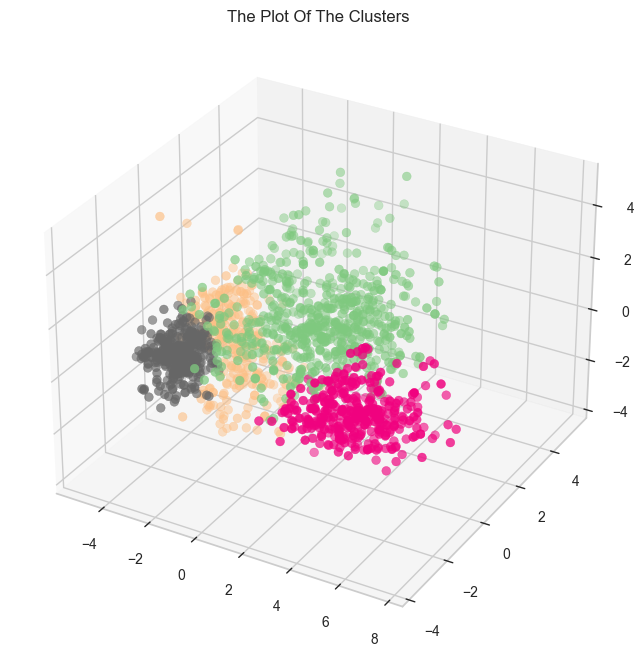

In [346]:
#Plotting the clusters
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(PCA_df["col1"],PCA_df["col2"],PCA_df["col3"], s=40, c=PCA_df["Clusters"], marker='o', cmap = "Accent")
ax.set_title("The Plot Of The Clusters")
plt.show()

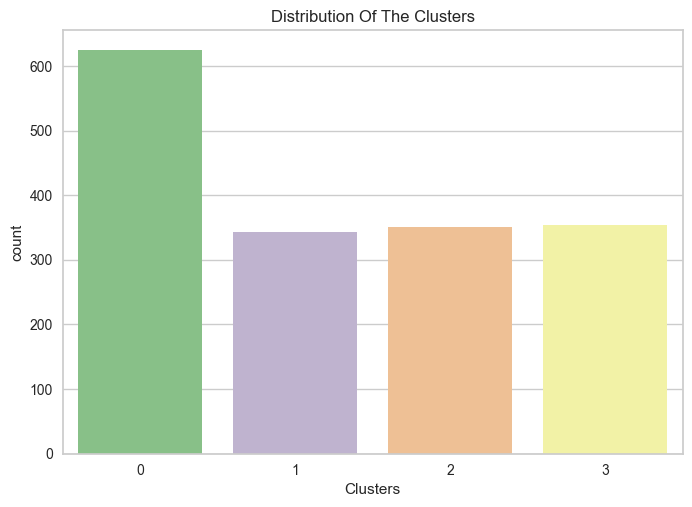

In [347]:
fig = sns.countplot(x=PCA_df["Clusters"], palette= "Accent")
fig.set_title("Distribution Of The Clusters")
plt.show()

In [348]:
from sklearn.metrics import silhouette_score
score = silhouette_score(PCA_df,yhat_AC)
score

0.3671267390506681

<div style="color: green; background-color:white; text-align: left;">
    <h1>Classification</h1>
</div>

Now I will do the preduction of the cluster through Random Forest Classification

In [349]:
df.drop(["ID","Year_Birth"],axis=1,inplace=True)

In [350]:
X = df.loc[:,['Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'MntCoke', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds','NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth']]
y = df.loc[:,['Response']]


In [351]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [352]:

from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()
model.fit(X_train,y_train)

RandomForestClassifier()

In [353]:
model.score(X_train,y_train)

0.994413407821229

<div style="color: purple; background-color:white; text-align: left;">
    <h1>Testing Dataset</h1>
</div>

In [354]:
#for test_data
data = pd.read_csv('customer_test.csv')
data.head()

,Unnamed: 0.1,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,1681,1681,5939,1971,S1,Bertunangan,38232000.0,1,1,17-01-2014,...,5,0,0,0,0,0,0,3,11,0
1,1682,1682,2156,1955,S3,Menikah,22554000.0,1,1,03-11-2012,...,5,0,0,0,0,0,0,3,11,0
2,1683,1683,7788,1983,S3,Menikah,23536000.0,1,0,04-06-2014,...,3,0,0,0,0,0,0,3,11,0
3,1684,1684,10323,1952,S1,Menikah,49413000.0,0,1,25-10-2013,...,5,0,0,0,0,0,0,3,11,0
4,1685,1685,7947,1969,S1,Menikah,42231000.0,1,1,25-03-2014,...,5,0,0,0,0,0,0,3,11,0


In [355]:
# Checking the shape of the dataset

data.shape

(559, 31)

<div style="color: GREEN; background-color:white; text-align: left;">
    <h1>Data Cleaning</h1>
</div>

In [356]:
# Checking the columns of the dataset

data.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'ID', 'Year_Birth', 'Education',
       'Marital_Status', 'Income', 'Kidhome', 'Teenhome', 'Dt_Customer',
       'Recency', 'MntCoke', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
       'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact',
       'Z_Revenue', 'Response'],
      dtype='object')

In [357]:
# Checking if any NaN is present in column or not

data.isna().any()

Unnamed: 0.1           False
Unnamed: 0             False
ID                     False
Year_Birth             False
Education              False
Marital_Status         False
Income                  True
Kidhome                False
Teenhome               False
Dt_Customer            False
Recency                False
MntCoke                False
MntFruits              False
MntMeatProducts        False
MntFishProducts        False
MntSweetProducts       False
MntGoldProds           False
NumDealsPurchases      False
NumWebPurchases        False
NumCatalogPurchases    False
NumStorePurchases      False
NumWebVisitsMonth      False
AcceptedCmp3           False
AcceptedCmp4           False
AcceptedCmp5           False
AcceptedCmp1           False
AcceptedCmp2           False
Complain               False
Z_CostContact          False
Z_Revenue              False
Response               False
dtype: bool

Income column have some missing value in it so we will need to fill it by by either mean or median

In [358]:
#Since there are outliers, we are using the median

data['Income'] = data['Income'].fillna(data['Income'].median())
data.isna().any()

Unnamed: 0.1           False
Unnamed: 0             False
ID                     False
Year_Birth             False
Education              False
Marital_Status         False
Income                 False
Kidhome                False
Teenhome               False
Dt_Customer            False
Recency                False
MntCoke                False
MntFruits              False
MntMeatProducts        False
MntFishProducts        False
MntSweetProducts       False
MntGoldProds           False
NumDealsPurchases      False
NumWebPurchases        False
NumCatalogPurchases    False
NumStorePurchases      False
NumWebVisitsMonth      False
AcceptedCmp3           False
AcceptedCmp4           False
AcceptedCmp5           False
AcceptedCmp1           False
AcceptedCmp2           False
Complain               False
Z_CostContact          False
Z_Revenue              False
Response               False
dtype: bool

In [359]:
# Dropping columns because they will not contribute anything in model building
data.drop(["Unnamed: 0.1", "Unnamed: 0"],axis=1,inplace=True)

In [360]:
# Finding the number of unique values present in each column

data.nunique()

ID                     559
Year_Birth              52
Education                5
Marital_Status           5
Income                 540
Kidhome                  3
Teenhome                 3
Dt_Customer            379
Recency                 99
MntCoke                345
MntFruits              114
MntMeatProducts        273
MntFishProducts        131
MntSweetProducts       112
MntGoldProds           146
NumDealsPurchases       14
NumWebPurchases         15
NumCatalogPurchases     12
NumStorePurchases       14
NumWebVisitsMonth       13
AcceptedCmp3             2
AcceptedCmp4             2
AcceptedCmp5             2
AcceptedCmp1             2
AcceptedCmp2             2
Complain                 2
Z_CostContact            1
Z_Revenue                1
Response                 2
dtype: int64

* NOTE
In above cell "Z_CostContact" and "Z_Revenue" have same value in all the rows that's why they are not going to contribute anything in the model building. So we can drop them

In [361]:
data['Z_Revenue'].head(10)

0    11
1    11
2    11
3    11
4    11
5    11
6    11
7    11
8    11
9    11
Name: Z_Revenue, dtype: int64

In [362]:
#These 2 columns shows same data for all rows. it seems to be by mistake. So removing it
data=data.drop(data[['Z_Revenue','Z_CostContact']],axis=1)

In [363]:
data.Marital_Status.unique()


array(['Bertunangan', 'Menikah', 'Cerai', 'Lajang', 'Janda'], dtype=object)

In [364]:
# use the replace method to convert Indonesian to English
data['Marital_Status'].replace({'Lajang': 'Single', 
                              'Bertunangan': 'Engaged', 
                              'Menikah': 'Married', 
                              'Cerai': ' Divorced', 
                              'Janda': 'Widow', 
                              'Duda': 'Widower'}, inplace=True)
# Define a mapping dictionary for Education
education_mapping = {
    'S1':'Bsc',
    'S2':'Msc',
    'S3':'Phd',
    'D3':'Diploma',
    'SMA':'High SChool'
    
}

# Replace the Education values using the mapping dictionary
data['Education'].replace(education_mapping, inplace=True)

* Now we will deal with Dt_Custumer feature

In [365]:
data['Dt_Customer'] = pd.to_datetime(data['Dt_Customer'], format='%d-%m-%Y')
data['Dt_Customer'].head()

0   2014-01-17
1   2012-11-03
2   2014-06-04
3   2013-10-25
4   2014-03-25
Name: Dt_Customer, dtype: datetime64[ns]

<div style="color: GREEN; background-color:white; text-align: left;">
    <h1>Feature Engineering</h1>
</div>

In [366]:
# 1)Creating Age column from Year_Birth column.
data["Age"] = 2023 - data["Year_Birth"]

In [367]:
# 2)Creating Total_Kids column from Kidhome and Teenhome columns.
data["Total_kids"] = data["Kidhome"] + data["Teenhome"]

In [368]:
# 3)Creating Total_Mnt column from MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts and MntGoldProds columns.
data["Total_Mnt"] = data["MntCoke"] + data["MntFruits"] + data["MntMeatProducts"] + data["MntFishProducts"] + data["MntSweetProducts"] + data["MntGoldProds"]

In [369]:
# 4)Creating Total_Purchases column from NumWebPurchases,NumCatalogPurchases and NumStorePurchases columns.
data["Total_Purchases"] = data["NumWebPurchases"] + data["NumCatalogPurchases"] + data["NumStorePurchases"]

In [370]:
data.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,MntFruits,MntMeatProducts,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Total_kids,Total_Mnt,Total_Purchases
count,559.000000,559.000000,5.590000e+02,559.000000,559.000000,559,559.000000,5.590000e+02,559.000000,5.590000e+02,...,559.000000,559.000000,559.000000,559.000000,559.000000,559.000000,559.000000,559.000000,5.590000e+02,559.000000
mean,5721.500894,1968.663685,5.291030e+07,0.420394,0.525939,2013-07-07 22:01:30.161001728,49.187835,3.003488e+05,27293.381038,1.698909e+05,...,0.075134,0.084079,0.067979,0.017889,0.007156,0.164580,54.336315,0.946333,6.097657e+05,12.627907
min,17.000000,1940.000000,4.023000e+06,0.000000,0.000000,2012-08-01 00:00:00,0.000000,0.000000e+00,0.000000,0.000000e+00,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,28.000000,0.000000,8.000000e+03,0.000000
25%,2850.500000,1958.500000,3.438550e+07,0.000000,0.000000,2013-01-12 12:00:00,25.000000,2.300000e+04,2000.000000,1.500000e+04,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,46.000000,0.000000,6.800000e+04,6.000000
50%,5631.000000,1970.000000,5.246300e+07,0.000000,1.000000,2013-07-06 00:00:00,49.000000,1.750000e+05,8000.000000,6.400000e+04,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,53.000000,1.000000,4.130000e+05,13.000000
75%,8603.500000,1977.000000,6.925400e+07,1.000000,1.000000,2014-01-10 00:00:00,74.000000,5.140000e+05,35000.000000,2.245000e+05,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,64.500000,1.000000,1.059500e+06,19.000000
max,11187.000000,1995.000000,6.666660e+08,2.000000,2.000000,2014-06-28 00:00:00,99.000000,1.493000e+06,194000.000000,1.607000e+06,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,83.000000,3.000000,2.257000e+06,29.000000
std,3269.336755,11.867607,3.375898e+07,0.511880,0.527682,NaN,29.109522,3.303610e+05,40361.180414,2.300301e+05,...,0.263844,0.277754,0.251935,0.132667,0.084363,0.371133,11.867607,0.716410,6.035638e+05,7.308193


<div style="color: GREEN; background-color:white; text-align: left;">
    <h1>Data Preprocessing</h1>
</div>

In [371]:
#encoding
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()

col = ['Education','Marital_Status']
for i in col:
    data.loc[:, i] = label_encoder.fit_transform(data[i])
    
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Total_kids,Total_Mnt,Total_Purchases
0,5939,1971,0,1,38232000.0,1,1,2014-01-17,84,43000,...,0,0,0,0,0,0,52,2,122000,7
1,2156,1955,4,2,22554000.0,1,1,2012-11-03,38,27000,...,0,0,0,0,0,0,68,2,41000,6
2,7788,1983,4,2,23536000.0,1,0,2014-06-04,53,6000,...,0,0,0,0,0,0,40,1,10000,3
3,10323,1952,0,2,49413000.0,0,1,2013-10-25,88,205000,...,0,0,0,0,0,0,71,1,304000,11
4,7947,1969,0,2,42231000.0,1,1,2014-03-25,99,24000,...,0,0,0,0,0,0,54,2,37000,4


In [373]:
# creating a subset of dataframe by dropping the features on deals accepted and promotions
cols_del = ['Dt_Customer','AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1','AcceptedCmp2', 'Complain']
data=data.drop(cols_del, axis=1)

### scailing

In [374]:
#Scaling
scaler = StandardScaler()
scaler.fit(data)
scaled_dt = pd.DataFrame(scaler.transform(data),columns= data.columns)
print("All features are now scaled")

All features are now scaled


In [375]:
data.drop(["ID","Year_Birth"],axis=1,inplace=True)

In [376]:
X=data.loc[:,['Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'MntCoke', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds','NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth']]
y =data.loc[:,['Response']]

In [380]:
y_pred = model.predict(X_test)

In [382]:
accuracy_score(y_test, y_pred)

0.8779904306220095

<div style="color: green; background-color:white; text-align: left;">
    <h1>Conclusion</h1>
</div>



In this project, I performed unsupervised clustering. I did use dimensionality reduction followed by agglomerative clustering. I came up with 4 clusters and further used in clusters according to their family structures and income/spending. This can be used in planning better marketing strategies.

<div style="color: PURPLE; background-color:WHITE; text-align: center;">
    <h1>THANK YOU</h1>
</div>